## Import Libraries

In [2]:
import sys
sys.path.insert(0, '../')
from data.Reinhard import Reinhard
from models.model_mrcnn import _default_mrcnn_config, build_default
import torch
import pyvips as Vips
import numpy as np
#from Reinhard import Reinhard
import cv2
from PIL import Image
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import os
from explain import ExplainPredictions
import pdb

## Transform & Normalization

In [3]:
WGM_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(1024),
        #transforms.RandomHorizontalFlip(),
        #transforms.RandomVerticalFlip(),
        #transforms.FiveCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(1024),
        #transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(1024),
        #transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [4]:
def normalization(REF_IMG_PATH):
    print("Init Normalization")
    ref_image = Vips.Image.new_from_file(REF_IMG_PATH)
    normalizer = Reinhard()
    normalizer.fit(ref_image)
    return normalizer

## Load Models

In [5]:
def load_saved_model(path):
    checkpoint = torch.load(path)
    model_ft = checkpoint["model"]
    model_ft.load_state_dict(checkpoint['state'])
    return model_ft

In [6]:
LBD_model_path = '/home/mahirwar/Desktop/Monika/npsad_data/monika/LBD/models/mrcnn_models/royal-butterfly-145_mrcnn_model_10.pth'
#WM_model_path = '/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/WM_models/working_models/27qsmsq7-logs.pth'
WM_model_path = '/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/WM_models/best_models/2nqho457-logs2.pth'

In [7]:
test_config = dict(
        batch_size = 1,
        num_classes = 1
    )

model_config = _default_mrcnn_config(num_classes=1 + test_config['num_classes']).config
model_lbd = build_default(model_config, im_size=1024)
#model_lbd.eval()


/home/mahirwar/miniconda3/envs/kfold_amy_plaque1/lib/python3.9/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/home/mahirwar/miniconda3/envs/kfold_amy_plaque1/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/mahirwar/miniconda3/envs/kfold_amy_plaque1/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [8]:
explain = ExplainPredictions(model_lbd, model_input_path = LBD_model_path, test_input_path='', 
                                    detection_threshold=0.75, wandb='', save_result=False, ablation_cam=False, save_thresholds=False)

[[208.29572832]]


In [9]:
model_wgm = load_saved_model(WM_model_path)

## Get Output

In [10]:
def getVipsInfo(vips_img):
    # # Get bounds-x and bounds-y offeset
    vfields = [f.split('.') for f in vips_img.get_fields()]
    vfields = [f for f in vfields if f[0] == 'openslide']
    vfields = dict([('.'.join(k[1:]), vips_img.get('.'.join(k))) for k in vfields])
    return vfields

In [53]:
tilesize=1024
def crop2img(crop):
    crop_array = crop.numpy()
    crop_array = crop_array[:,:,:3]
    img = Image.fromarray(crop_array.astype('uint8'), 'RGB')
    return img

In [44]:
def predict_crop_class(model_ft, crop, data_transforms ):

    #crop_array = torch.from_numpy(crop_array.transpose((2,0,1)))
    #crop_array = crop_array.transpose(2,0,1)
    #img = Image.fromarray(np.uint8(crop_array.transpose((2,0,1)))).convert('RGB')
    img = crop2img(crop)
    transformed_img = data_transforms["test"](img)
    transformed_img = torch.unsqueeze(transformed_img, dim=0)
    outputs = model_ft(transformed_img.to(device).float())
    _, preds = torch.max(outputs, 1)
    return preds.tolist()

In [12]:
REF_IMG_PATH =  '/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD_Dataset/LBD/./DLB_cases/11_063_CG_aSyn_x200.svs'
img = '/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD_Dataset/LBD/PDD_cases/PDD_cases/././PD017_Syn1_CG.svs'
img = REF_IMG_PATH
REF_IMG_PATH=img
stride = 256
tilesize = 1024
path  = '/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/WM_models/2nqho457-logs2.pth'
save_dir = '/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/WM_segmentation_output'

In [35]:
vips_array = vips_img.numpy()

In [36]:
vips_array.shape

(33339, 53783, 4)

In [39]:
#normalizer = normalization(REF_IMG_PATH)
vips_img = Vips.Image.new_from_file(img, level=0)
#vips_img = normalizer.transform(vips_img)
print("done normalization")
vinfo = getVipsInfo(vips_img)
orig_w, orig_h = int(vinfo['level[0].width']), int(vinfo['level[0].height'])
vips_array = vips_img.numpy()
#vips_array = np.ndarray(buffer=vips_img.write_to_memory(), dtype=np.uint8, shape=(vips_img.width, vips_img.height, vips_img.bands))
vips_array = vips_array[:,:,:3]
vips_array_copy =vips_array.copy()
#vips_img_new1=vips_img.copy()
masked_image = np.zeros((orig_h,orig_w))
count_predictions = {"white":0,"grey":0,"bg":0}   
vips_img_new1 = Vips.Image.new_from_array(vips_array_copy)                                      

done normalization


In [1]:
orig_w, orig_h 

NameError: name 'orig_w' is not defined

In [37]:
orig_h, orig_w

(33339, 53783)

In [40]:
import random
class_names = ['True']
class_to_colors = {'True': (255, 0, 0)}

colors = np.random.uniform(0, 255, size=(len(class_names), 1))

def draw_segmentation_map(image, masks, boxes, labels):
        alpha = 1 
        beta = 0.6 # transparency for the segmentation map
        gamma = 0 # scalar added to each 
        # segmentation_map = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        # result_masks = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        segmentation_map = np.zeros((1024, 1024), dtype=np.uint8)
        result_masks = np.zeros((1024, 1024), dtype=np.uint8)

        for i in range(len(masks)):

            # TODO fix the color segmentation masks
            red_map = np.zeros_like(masks[i]).astype(np.uint8)
            green_map = np.zeros_like(masks[i]).astype(np.uint8)
            blue_map = np.zeros_like(masks[i]).astype(np.uint8)
            
            # apply a randon color mask to each object
            rect_color = (0,0,0)
            color = colors[random.randrange(0, len(colors))]
            red_map[masks[i] == 1], green_map[masks[i] == 1], blue_map[masks[i] == 1]  = class_to_colors[labels[i]]
            result_masks[masks[i] == 1] = 255
            # combine all the masks into a single image
            # change the format of mask to W,H, C

            # segmentation_map = np.stack([red_map, green_map, blue_map], axis=2)
            #convert the original PIL image into NumPy format
            #image = np.array(image)
            # convert from RGB to OpenCV BGR format
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            # apply mask on the image
            # cv2.addWeighted(image, alpha, segmentation_map, beta, gamma, image)
            # draw the bounding boxes around the objects
            cv2.rectangle(image, boxes[i][0], boxes[i][1], color=rect_color, 
                        thickness=2)
            # Get the centre coords of the rectangle-plaque-detection/src/visualizat
            x1 = boxes[i][0][0]
            y1 = boxes[i][0][1]
            x2 = boxes[i][1][0]
            y2 = boxes[i][1][1]
            x = int((x1 + x2) / 2)
            y = int((y1+y2) / 2)

            
            # put the label text above the objects
            cv2.putText(image , labels[i], (x1, y1-20), 
                        cv2.FONT_HERSHEY_SIMPLEX, 1, color, 
                        thickness=2, lineType=cv2.LINE_AA)
            
            # Convert Back
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image, result_masks


In [18]:
lb_count = 0
images_lists = []
result_masks_list = []
coords_list =[]
scores_list = []
boxes_list=[]
labels_list=[]
for y_val in range(0, orig_h-stride, stride):
    for x_val in range(0, orig_w-stride, stride): 
            #print(y_val,"-", x_val)
            if y_val + tilesize < orig_h and x_val + tilesize < orig_w:
                crop = vips_img.crop(x_val, y_val, tilesize, tilesize)
                crop_pred =  predict_crop_class(model_wgm, crop, WGM_transforms)
                #print(crop_pred)
                if crop_pred==[0]:
                        count_predictions["white"] = count_predictions["white"]+1
                        #masked_image[x_val:x_val+tilesize, y_val:y_val+tilesize] = 0
                        #vips_array_copy = cv2.rectangle(vips_array_copy,(x_val, y_val),(x_val + tilesize,y_val + tilesize),(255,0,0),30)
                if crop_pred==[2]:
                        count_predictions["bg"] = count_predictions["bg"]+1
                        #masked_image[x_val:x_val+tilesize, y_val:y_val+tilesize] = 1
                        #vips_array_copy = cv2.rectangle(vips_array_copy,(x_val, y_val),(x_val + tilesize,y_val + tilesize),(0,0,0),30)
                if crop_pred==[1]:
                        count_predictions["grey"] = count_predictions["grey"]+1
                        masked_image[x_val:x_val+tilesize, y_val:y_val+tilesize] = 1
                        #vips_array_copy = cv2.rectangle(vips_array_copy,(x_val, y_val),(x_val + tilesize,y_val + tilesize),(0,255,0),30)
                        image = crop2img(crop)
                        #print(img)
                        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
                        model_lbd.eval().to(device)
                        image = np.array(image)
                        
                        if image.shape[2] == 4:
                                image = image[:,:, :3]
                        
                        input_tensor, image_float_np = explain.prepare_input(image)
                        masks, boxes, labels, scores = explain.get_outputs(input_tensor, model_lbd, 0.75)
                        #result_img, result_masks = draw_segmentation_map(image, masks, boxes, labels)  
                        if len(labels)>=1:
                                lb_count=lb_count+1
                                #tiled_vips = Vips.Image.new_from_array(result_img)
                                #result_masks_list.append(result_masks)
                                #images_list.append(result_img)
                                #vips_img_new1= vips_img_new1.insert(tiled_vips,boxes[0][0][1],boxes[0][0][0])
                                print(lb_count)
                                images_lists.append(image)
                                coords_list.append([y_val,x_val])
                                scores_list.append(scores)
                                boxes_list.append(boxes)
                                labels_list.append(labels)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [29]:
vips_img = Vips.Image.new_from_file(img, level=0)

In [46]:
vips_array.shape

(33339, 53783, 3)

In [49]:
orig_w

53783

In [50]:
orig_h

33339

In [60]:
stride = 256
for x_val in range(0, orig_h-stride, stride):
    for x_val in range(0, orig_w-stride, stride): 
            #print(y_val,"-", x_val)
            if y_val + tilesize < orig_h and x_val + tilesize < orig_w:
                crop = vips_img.crop(x_val, y_val, tilesize, tilesize)
                crop_pred =  predict_crop_class(model_wgm, crop, WGM_transforms)
                if crop_pred==[0]:
                    count_predictions["white"] = count_predictions["white"]+1
                if crop_pred==[2]:
                        count_predictions["bg"] = count_predictions["bg"]+1
                if crop_pred==[1]:
                        count_predictions["grey"] = count_predictions["grey"]+1
                        masked_image[x_val:x_val+tilesize, y_val:y_val+tilesize] = 1

Error: unable to call crop
  extract_area: bad extract area


In [21]:
masked_image.sum()

234905344.0

In [32]:
th1 = Image.fromarray(vips_array.astype(np.uint8))
th1.thumbnail((1000,1000))

In [33]:
vips_array.shape

(53783, 33339, 3)

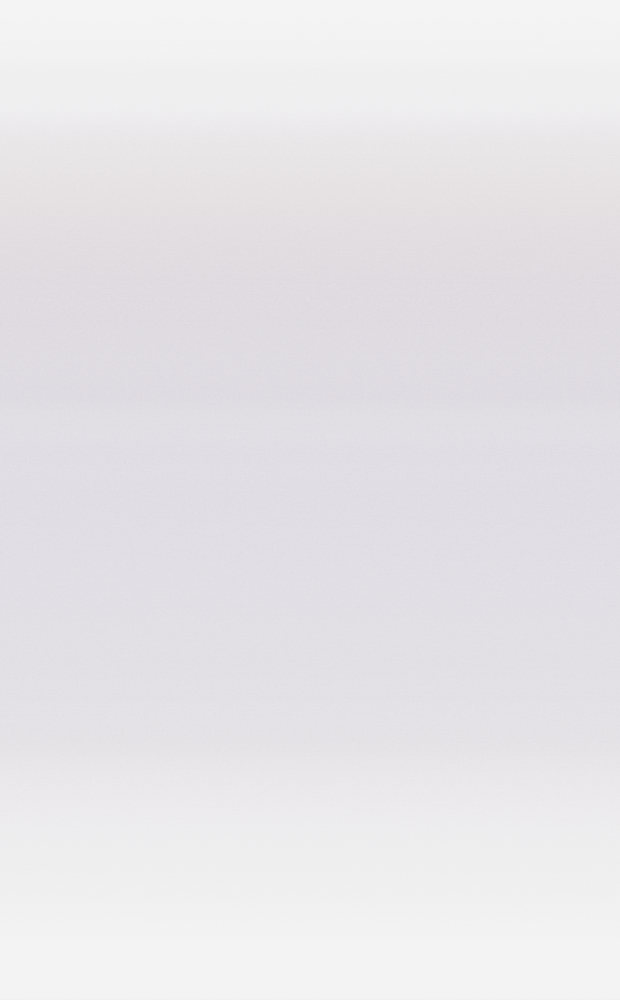

In [34]:
th1

In [22]:
1024*512

524288

In [50]:
result_masks_list = []
images_list = []
stride = 1024
lb_count=0
for y_val in range(0, orig_h-stride, stride):
    for x_val in range(0, orig_w-stride, stride): 
        if y_val + tilesize < orig_h and x_val + tilesize < orig_w:
            if np.sum(masked_image[x_val:x_val+tilesize, y_val:y_val+tilesize])>=524288:
                crop = vips_img.crop(x_val, y_val, tilesize, tilesize)
                image = crop2img(crop)
                device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
                model_lbd.eval().to(device)
                image = np.array(image)
                if image.shape[2] == 4:
                    image = image[:,:, :3]
                input_tensor, image_float_np = explain.prepare_input(image)
                masks, boxes, labels, scores = explain.get_outputs(input_tensor, model_lbd, 0.6)
                result_img, result_masks = draw_segmentation_map(image, masks, boxes, labels)  
                if len(labels)>=1:
                    lb_count=lb_count+1
                    tiled_vips = Vips.Image.new_from_array(result_img)
                    result_masks_list.append(result_masks)
                    images_list.append(result_img)
                    print(lb_count)
                    vips_img_new1= vips_img_new1.insert(tiled_vips,boxes[0][0][1],boxes[0][0][0])
            
        

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55


<pyvips.Image 1024x1024 uchar, 3 bands, srgb>

In [39]:
boxes[0][0][1]

113

In [89]:
def nms_pytorch(P : torch.tensor ,thresh_iou : float):
    """
    Apply non-maximum suppression to avoid detecting too many
    overlapping bounding boxes for a given object.
    Args:
        boxes: (tensor) The location preds for the image 
            along with the class predscores, Shape: [num_boxes,5].
        thresh_iou: (float) The overlap thresh for suppressing unnecessary boxes.
    Returns:
        A list of filtered boxes, Shape: [ , 5]
    """
 
    # we extract coordinates for every 
    # prediction box present in P
    x1 = P[:, 0]
    y1 = P[:, 1]
    x2 = P[:, 2]
    y2 = P[:, 3]
 
    # we extract the confidence scores as well
    scores = P[:, 4]
 
    # calculate area of every block in P
    areas = (x2 - x1) * (y2 - y1)
     
    # sort the prediction boxes in P
    # according to their confidence scores
    #order = scores.argsort()
    order = scores.argsort()
 
    # initialise an empty list for 
    # filtered prediction boxes
    keep = []
     
 
    while len(order) > 0:
         
        # extract the index of the 
        # prediction with highest score
        # we call this prediction S
        idx = order[-1]
 
        # push S in filtered predictions list
        keep.append(P[idx])
 
        # remove S from P
        order = order[:-1]
 
        # sanity check
        if len(order) == 0:
            break
         
        # select coordinates of BBoxes according to 
        # the indices in order
        xx1 = torch.index_select(x1,dim = 0, index = order)
        xx2 = torch.index_select(x2,dim = 0, index = order)
        yy1 = torch.index_select(y1,dim = 0, index = order)
        yy2 = torch.index_select(y2,dim = 0, index = order)
 
        # find the coordinates of the intersection boxes
        xx1 = torch.max(xx1, x1[idx])
        yy1 = torch.max(yy1, y1[idx])
        xx2 = torch.min(xx2, x2[idx])
        yy2 = torch.min(yy2, y2[idx])
 
        # find height and width of the intersection boxes
        w = xx2 - xx1
        h = yy2 - yy1
         
        # take max with 0.0 to avoid negative w and h
        # due to non-overlapping boxes
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
 
        # find the intersection area
        inter = w*h
 
        # find the areas of BBoxes according the indices in order
        rem_areas = torch.index_select(areas, dim = 0, index = order) 
 
        # find the union of every prediction T in P
        # with the prediction S
        # Note that areas[idx] represents area of S
        union = (rem_areas - inter) + areas[idx]
         
        # find the IoU of every prediction in P with S
        IoU = inter / union

        #if IoU<=0:
        # keep the boxes with IoU less than thresh_iou
        mask = IoU <=0 
        order = order[mask]
     
    return keep

In [91]:

for i in range(len(boxes_list)):
    new_list = []
    for j in range(len(boxes_list[i])):
        new_list.append([boxes_list[i][j][0][0],boxes_list[i][j][0][1],boxes_list[i][j][1][0],boxes_list[i][j][1][1],scores_list[i][j]])
        f = nms_pytorch(torch.tensor(new_list),0)
        print(f)

[tensor([7.9600e+02, 7.2800e+02, 8.1700e+02, 7.6000e+02, 6.3068e-01])]
[tensor([7.9600e+02, 7.2800e+02, 8.1700e+02, 7.6000e+02, 6.3068e-01]), tensor([8.6700e+02, 7.0100e+02, 8.8700e+02, 7.2900e+02, 6.2976e-01])]
[tensor([7.9600e+02, 7.2800e+02, 8.1700e+02, 7.6000e+02, 6.3068e-01]), tensor([8.6700e+02, 7.0100e+02, 8.8700e+02, 7.2900e+02, 6.2976e-01]), tensor([8.2700e+02, 5.0300e+02, 8.4700e+02, 5.3300e+02, 6.2400e-01])]
[tensor([7.9600e+02, 7.2800e+02, 8.1700e+02, 7.6000e+02, 6.3068e-01]), tensor([8.6700e+02, 7.0100e+02, 8.8700e+02, 7.2900e+02, 6.2976e-01]), tensor([8.2700e+02, 5.0300e+02, 8.4700e+02, 5.3300e+02, 6.2400e-01]), tensor([9.6000e+02, 9.6100e+02, 9.8200e+02, 9.9300e+02, 6.2281e-01])]
[tensor([7.9600e+02, 7.2800e+02, 8.1700e+02, 7.6000e+02, 6.3068e-01]), tensor([8.6700e+02, 7.0100e+02, 8.8700e+02, 7.2900e+02, 6.2976e-01]), tensor([8.2700e+02, 5.0300e+02, 8.4700e+02, 5.3300e+02, 6.2400e-01]), tensor([9.6000e+02, 9.6100e+02, 9.8200e+02, 9.9300e+02, 6.2281e-01])]
[tensor([7.9600

[tensor([7.9600e+02, 7.2800e+02, 8.1700e+02, 7.6000e+02, 6.3068e-01]), tensor([8.6700e+02, 7.0100e+02, 8.8700e+02, 7.2900e+02, 6.2976e-01]), tensor([8.2700e+02, 5.0300e+02, 8.4700e+02, 5.3300e+02, 6.2400e-01]), tensor([9.6000e+02, 9.6100e+02, 9.8200e+02, 9.9300e+02, 6.2281e-01]), tensor([7.3900e+02, 6.4000e+02, 7.6100e+02, 6.7700e+02, 6.1903e-01]), tensor([7.4800e+02, 9.2400e+02, 7.7100e+02, 9.5700e+02, 6.1773e-01]), tensor([5.9800e+02, 7.0300e+02, 6.2000e+02, 7.3800e+02, 6.1530e-01]), tensor([5.6200e+02, 6.9700e+02, 5.8600e+02, 7.2900e+02, 6.1448e-01]), tensor([9.2100e+02, 8.4800e+02, 9.4500e+02, 8.7900e+02, 6.1403e-01]), tensor([7.8500e+02, 4.0900e+02, 8.0900e+02, 4.3900e+02, 6.0902e-01]), tensor([1.0000e+03, 9.1700e+02, 1.0230e+03, 9.5100e+02, 6.0824e-01]), tensor([7.8700e+02, 9.9100e+02, 8.0900e+02, 1.0240e+03, 6.0578e-01]), tensor([8.3100e+02, 9.7500e+02, 8.5200e+02, 1.0100e+03, 6.0455e-01]), tensor([9.7100e+02, 9.9800e+02, 9.9600e+02, 1.0230e+03, 6.0314e-01]), tensor([8.5400e+02,

KeyboardInterrupt: 

In [81]:
new_list.argsort()

AttributeError: 'list' object has no attribute 'argsort'

In [56]:
# Let P be the following
P = torch.tensor(new_list)

In [60]:
len(new_list)

577300

In [85]:
filtered_boxes = nms_pytorch(P,0)

In [87]:

len(filtered_boxes)

1893

In [86]:
filtered_boxes

[tensor([1.0100e+03, 8.0900e+02, 1.0230e+03, 8.3800e+02, 6.1384e-01]),
 tensor([1.0100e+03, 3.5000e+01, 1.0230e+03, 7.6000e+01, 5.6204e-01]),
 tensor([1.0090e+03, 1.7500e+02, 1.0230e+03, 1.9700e+02, 7.4348e-01]),
 tensor([1.0080e+03, 2.9600e+02, 1.0240e+03, 3.2700e+02, 6.0828e-01]),
 tensor([1.0080e+03, 9.5100e+02, 1.0230e+03, 9.8200e+02, 5.7417e-01]),
 tensor([1.0070e+03, 5.8300e+02, 1.0240e+03, 6.0800e+02, 6.2255e-01]),
 tensor([1.0070e+03, 4.5600e+02, 1.0230e+03, 4.8800e+02, 5.9640e-01]),
 tensor([1.0070e+03, 4.2000e+02, 1.0240e+03, 4.5600e+02, 5.8993e-01]),
 tensor([1.0070e+03, 8.5400e+02, 1.0230e+03, 8.8000e+02, 6.4862e-01]),
 tensor([1.0070e+03, 3.2700e+02, 1.0240e+03, 3.5200e+02, 6.2252e-01]),
 tensor([1.0060e+03, 3.7400e+02, 1.0230e+03, 4.0500e+02, 5.9200e-01]),
 tensor([1.0060e+03, 7.5700e+02, 1.0230e+03, 7.8500e+02, 6.3291e-01]),
 tensor([1.0060e+03, 6.7200e+02, 1.0230e+03, 7.1000e+02, 5.7243e-01]),
 tensor([1.0060e+03, 1.0030e+03, 1.0230e+03, 1.0240e+03, 5.7779e-01]),
 tenso

In [61]:
filtered_boxes

[tensor([6.0000e+00, 9.4300e+02, 2.1000e+01, 9.7200e+02, 9.5154e-01]),
 tensor([  6.0000, 175.0000,  21.0000, 203.0000,   0.9515]),
 tensor([  6.0000, 431.0000,  21.0000, 459.0000,   0.9515]),
 tensor([  6.0000, 687.0000,  21.0000, 715.0000,   0.9515]),
 tensor([ 13.0000, 433.0000,  29.0000, 459.0000,   0.9506]),
 tensor([ 13.0000, 689.0000,  29.0000, 715.0000,   0.9505]),
 tensor([ 13.0000, 177.0000,  29.0000, 203.0000,   0.9504]),
 tensor([1.3000e+01, 9.4600e+02, 2.9000e+01, 9.7200e+02, 9.4967e-01]),
 tensor([  0.0000, 431.0000,   6.0000, 460.0000,   0.9456]),
 tensor([  0.0000, 687.0000,   6.0000, 716.0000,   0.9456]),
 tensor([  0.0000, 175.0000,   6.0000, 204.0000,   0.9456]),
 tensor([0.0000e+00, 9.4400e+02, 6.0000e+00, 9.7200e+02, 9.4477e-01]),
 tensor([500.0000, 185.0000, 518.0000, 200.0000,   0.9392]),
 tensor([756.0000, 185.0000, 774.0000, 200.0000,   0.9392]),
 tensor([244.0000, 185.0000, 262.0000, 200.0000,   0.9392]),
 tensor([499.0000, 441.0000, 518.0000, 456.0000,   0.93

In [22]:
#from typing import TypeAlias

#Box = tuple[float, float, float, float]

def calcul_area(box):
    x1, y1, x2, y2 = box
    return abs(x1 - x2) * abs(y1 - y2)

In [44]:
def nms_overlap(box_lhs, box_rhs) -> bool:
    x1_lhs, y1_lhs, x2_lhs, y2_lhs = box_lhs
    x1_rhs, y1_rhs, x2_rhs, y2_rhs = box_rhs

    area_lhs = calcul_area(box_lhs)
    area_rhs = calcul_area(box_rhs)

    # Determines the coordinates of the intersection box
    x1_inter = max(x1_lhs, x1_rhs)
    y1_inter = max(y1_lhs, y1_rhs)
    x2_inter = min(x2_lhs, x2_rhs)
    y2_inter = min(y2_lhs, y2_rhs)

    # Determines if the boxes overlap or not
    # If one of the two is equal to 0, the boxes do not overlap
    inter_w = max(0.0, x2_inter - x1_inter)
    inter_h = max(0.0, y2_inter - y1_inter)

    if inter_w == 0.0 or inter_h == 0.0:
        return True
    return False

In [45]:
def nms_algorithm(boxes):
    if len(boxes) == 0:
        return []

    keeped_box_id, keeped_box, keeped_box_score = boxes.pop(0)

    tmp_boxes: list[tuple[int, Box]] = []
    for (id, box, score) in boxes:
        if nms_overlap(keeped_box, box)==True:
            if score>keeped_box_score:
                tmp_boxes.append((id, box))
        else:
            print(f"Delete box {id}. Overlapping with {keeped_box_id}.")

    return [
        (keeped_box_id, keeped_box),
        *nms_algorithm(tmp_boxes),
    ]

In [41]:
boxes= [(i, (boxes_list[i][0][0][0],boxes_list[i][0][0][1],boxes_list[i][0][1][0], boxes_list[i][0][1][1]), max(scores_list[0])) for i in range(len(boxes_list))]
#boxes.sort(key=lambda x: calcul_area(x[1]), reverse=True)
#keeped_boxes = nms_algorithm(boxes)
#keeped_boxes.sort(key=lambda x: x[0])

In [42]:
boxes

[(0, (796, 728, 817, 760), 0.63068366),
 (1, (760, 311, 781, 340), 0.63068366),
 (2, (504, 311, 525, 340), 0.63068366),
 (3, (859, 1006, 877, 1024), 0.63068366),
 (4, (603, 1006, 621, 1024), 0.63068366),
 (5, (347, 1006, 365, 1024), 0.63068366),
 (6, (91, 1006, 109, 1024), 0.63068366),
 (7, (434, 751, 459, 783), 0.63068366),
 (8, (178, 751, 203, 783), 0.63068366),
 (9, (852, 886, 876, 920), 0.63068366),
 (10, (596, 886, 621, 920), 0.63068366),
 (11, (340, 886, 365, 920), 0.63068366),
 (12, (84, 886, 108, 919), 0.63068366),
 (13, (372, 822, 395, 852), 0.63068366),
 (14, (116, 822, 139, 852), 0.63068366),
 (15, (284, 836, 306, 863), 0.63068366),
 (16, (25, 836, 47, 867), 0.63068366),
 (17, (918, 922, 938, 952), 0.63068366),
 (18, (954, 926, 976, 956), 0.63068366),
 (19, (699, 925, 720, 954), 0.63068366),
 (20, (443, 925, 464, 954), 0.63068366),
 (21, (187, 925, 208, 954), 0.63068366),
 (22, (852, 630, 876, 664), 0.63068366),
 (23, (596, 630, 620, 664), 0.63068366),
 (24, (884, 566, 907, 

In [46]:
keeped_boxes = nms_algorithm(boxes)

Delete box 1421. Overlapping with 1.
Delete box 1500. Overlapping with 1.
Delete box 2744. Overlapping with 1.
Delete box 2762. Overlapping with 1.
Delete box 2868. Overlapping with 1.
Delete box 2934. Overlapping with 1.
Delete box 3083. Overlapping with 1.
Delete box 3676. Overlapping with 1.
Delete box 4029. Overlapping with 1.
Delete box 4363. Overlapping with 1.
Delete box 4994. Overlapping with 1.


In [47]:
print(f"\nKeeped boxes:{[id for id, _ in keeped_boxes]}")


Keeped boxes:[1]


In [ ]:
boxes: list[tuple[int, Box]] = [
    (0, (156.52566528320312, 411.3934326171875, 508.0946350097656, 445.0401611328125)),
    (1, (153.34573364257812, 447.56744384765625, 1044.3194580078125, 612.4976196289062)),
    (2, (150.6321258544922, 662.0474243164062, 1076.75439453125, 899.3271484375)),
    (3, (154.38674926757812, 945.8661499023438, 1060.038330078125, 1026.8682861328125)),
    (4, (138.6205596923828, 951.3151245117188, 1035.56884765625, 1027.590087890625)),
    (5, (1245.50048828125, 410.4453430175781, 1393.0701904296875, 445.3376770019531)),
    (6, (1240.206787109375, 456.7169189453125, 2139.934326171875, 659.1046752929688)),
    (7, (1236.478759765625, 568.0098876953125, 2145.948486328125, 654.7606201171875)),
    (8, (1244.784912109375, 702.7620239257812, 2121.079345703125, 736.1748046875)),
    (9, (1244.885986328125, 746.2633666992188, 2151.534423828125, 991.8198852539062)),
    (10, (1251.84814453125, 1031.8487548828125, 2134.333251953125, 1153.9320068359375)),
    (11, (1254.38330078125, 1035.0196533203125, 2163.969970703125, 1153.2939453125)),
]

print(f"Entry boxes:{[id for id, _ in boxes]}\n")

# Sort the boxes from the largest to the smallest
# Will be useful to check if a smaller box is in the other one later
boxes.sort(key=lambda x: calcul_area(x[1]), reverse=True)

keeped_boxes = nms_algorithm(boxes, 0.9)
keeped_boxes.sort(key=lambda x: x[0])

print(f"\nKeeped boxes:{[id for id, _ in keeped_boxes]}")

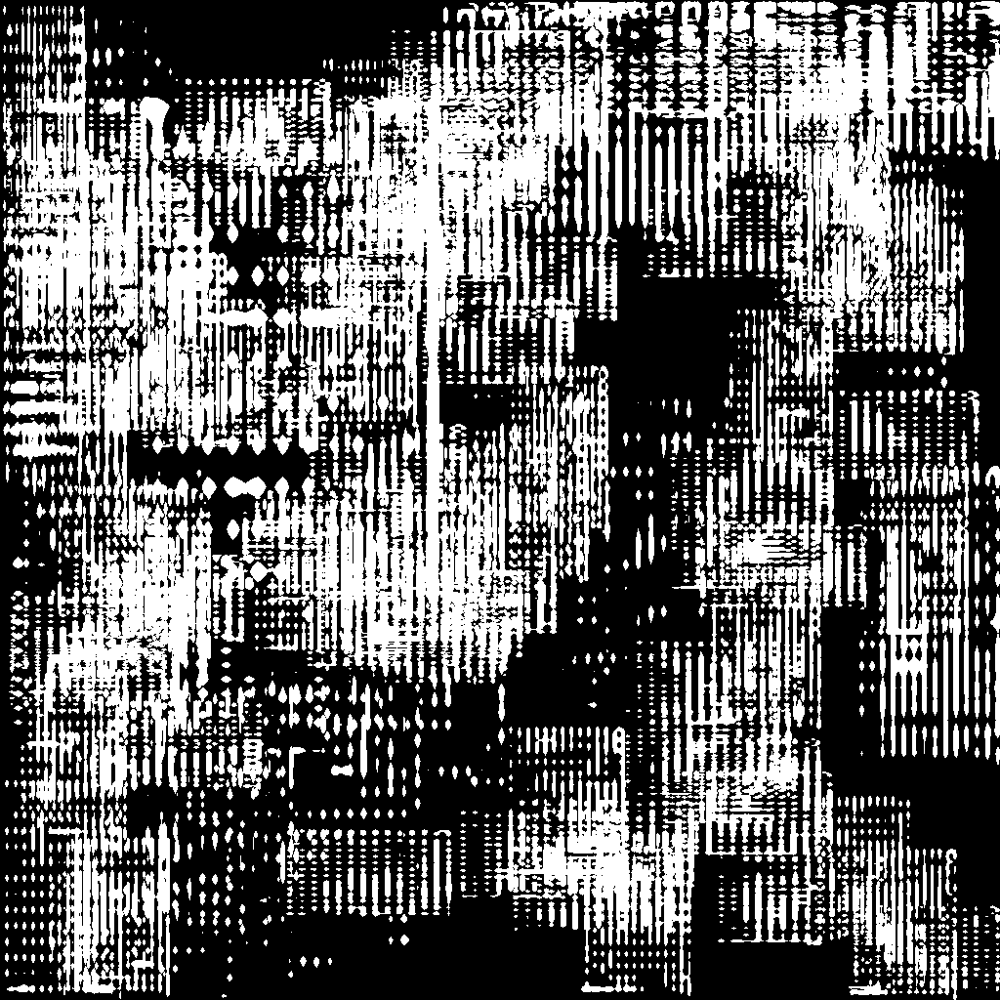

In [34]:
Image.fromarray(result_masks_list[100])

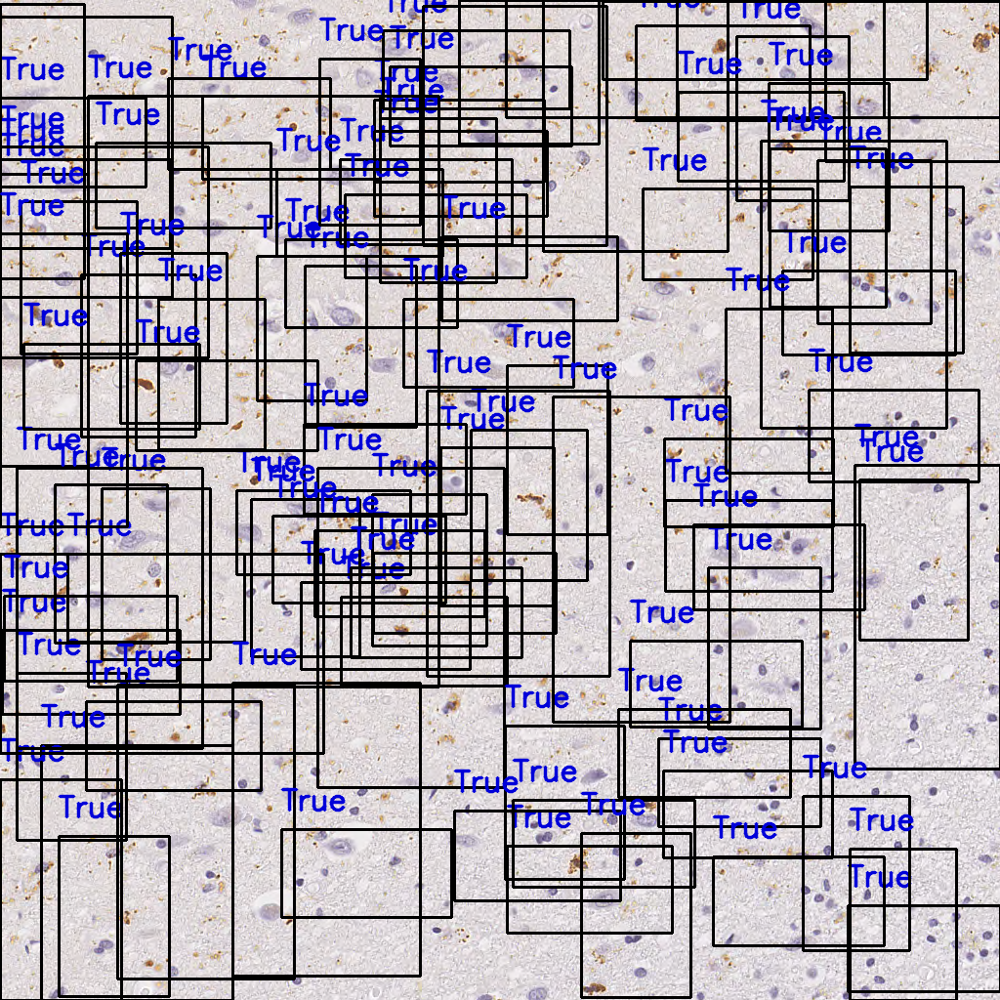

In [35]:
Image.fromarray(images_list[100])

In [ ]:
## do downscale level 
# --- downscale image
# 

In [26]:
vips_img_new1.tiffsave("/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/stitched_img1.tiff", tile=False, compression='lzw', bigtiff=False, pyramid=False)

In [37]:
count_predictions

{'white': 9140, 'grey': 11376, 'bg': 5773}

In [16]:
crop_pred

[2]

In [22]:
vips_array = np.ndarray(buffer=vips_img_new1.write_to_memory(), dtype=np.uint8, shape=(vips_img_new1.height, vips_img_new1.width, vips_img_new1.bands))
vips_array = vips_array[:,:,:3]

In [ ]:
th1 = Image.fromarray(vips_array.astype(np.uint8))
vips_img_new1.thumbnail((1000,1000))

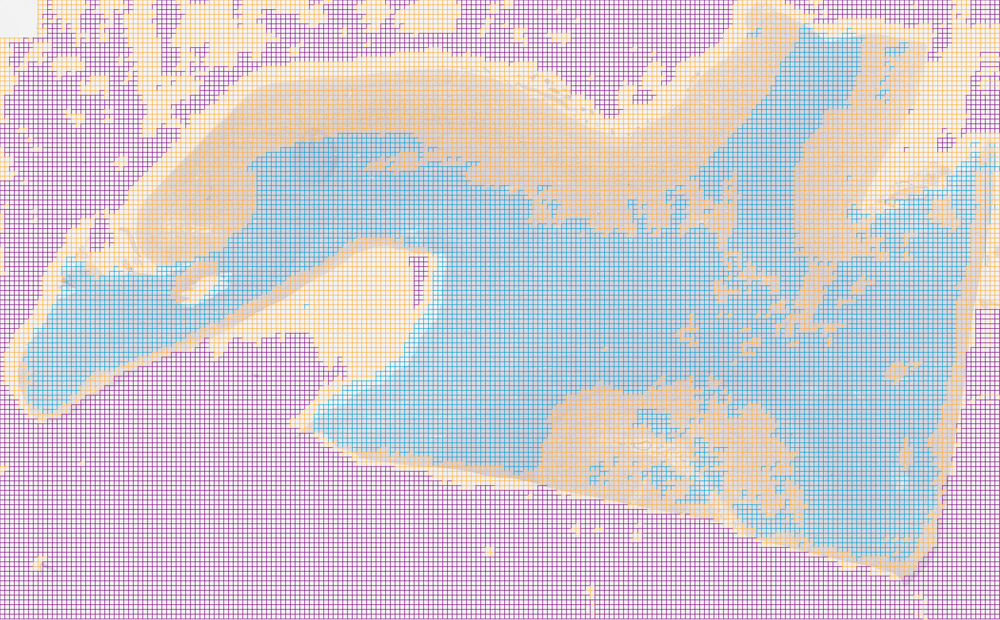

In [24]:
th1

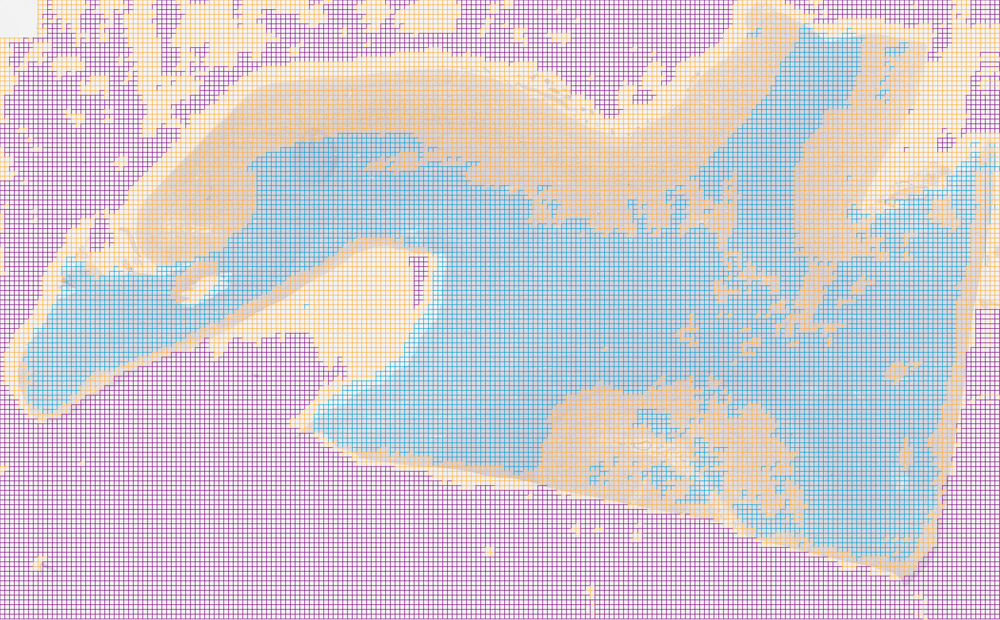

In [21]:
th1

In [ ]:
import matplotlib.pyplot as plt
gray_img_path = "/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/Reports/WM_model_gray_crops"
results_path="/gladstone/finkbeiner/steve/work/data/npsad_data/monika/LBD/Reports/LB_output"
imgs = os.listdir(gray_img_path)

for im in imgs:
        image = Image.open(os.path.join(gray_img_path,im))
        #print(img)
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        model_lbd.eval().to(device)
        image = np.array(image)

        if image.shape[2] == 4:
                image = image[:,:, :3]

        input_tensor, image_float_np = explain.prepare_input(image)
        masks, boxes, labels, scores = explain.get_outputs(input_tensor, model_lbd, 0.75)
        result_img, result_masks = explain.draw_segmentation_map(image, masks, boxes, labels)
        img_array = [result_img, result_masks]
        
        for j in range(2):
                plt.subplot(1, 2, j+1)
                plt.imshow(img_array[j])
        if len(labels)>=1:    
                result_img_name = im +  "_result.png"
                result_save_path = os.path.join(results_path, result_img_name)
                plt.savefig(result_save_path)
        plt.close()